In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as img
import cv2
import itertools
import pathlib
import warnings
import os
import random
import time
import gc
from IPython.display import Markdown, display
from PIL import Image
from random import randint
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import matthews_corrcoef as MCC
from sklearn.metrics import balanced_accuracy_score as BAS
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tensorflow import keras
import tensorflow.keras as keras
from keras import Sequential
from keras import layers
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Sequential, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Dropout,SeparableConv2D, Activation, BatchNormalization, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing.image import ImageDataGenerator as IDG
warnings.filterwarnings("ignore")

def printmd(string):   
    display(Markdown(string))
    
np.random.seed(0) # Add random seed of training for reproducibility

def load_images_from_folder(folder,only_path = False, label = ""):
    if only_path == False:
        images = []
        for filename in os.listdir(folder):
            img = plt.imread(os.path.join(folder,filename))
            if img is not None:
                images.append(img)
        return images
    else:
        path = []
        for filename in os.listdir(folder):
            img_path = os.path.join(folder,filename)
            if img_path is not None:
                path.append([label,img_path])
        return path

In [2]:
images = []
dirp = "/kaggle/input/fruit-recognition/"
for f in os.listdir(dirp):
    if "png" in os.listdir(dirp+f)[0]:
        images += load_images_from_folder(dirp+f,True,label = f)
    else: 
        for d in os.listdir(dirp+f):
            images += load_images_from_folder(dirp+f+"/"+d,True,label = f)
            
df = pd.DataFrame(images, columns = ["fruit", "path"])

from sklearn.utils import shuffle
df = shuffle(df, random_state = 0)
df = df.reset_index(drop=True)

fruit_names = sorted(df.fruit.unique())
mapper_fruit_names = dict(zip(fruit_names, [t for t in range(len(fruit_names))]))
df["label"] = df["fruit"].map(mapper_fruit_names)
print(mapper_fruit_names)

df.head()

{'Apple': 0, 'Banana': 1, 'Carambola': 2, 'Guava': 3, 'Kiwi': 4, 'Mango': 5, 'Orange': 6, 'Peach': 7, 'Pear': 8, 'Persimmon': 9, 'Pitaya': 10, 'Plum': 11, 'Pomegranate': 12, 'Tomatoes': 13, 'muskmelon': 14}


,fruit,path,label
0,Pomegranate,/kaggle/input/fruit-recognition/Pomegranate/Po...,12
1,Pomegranate,/kaggle/input/fruit-recognition/Pomegranate/Po...,12
2,Kiwi,/kaggle/input/fruit-recognition/Kiwi/kiwi A/Ki...,4
3,Mango,/kaggle/input/fruit-recognition/Mango/Mango003...,5
4,Guava,/kaggle/input/fruit-recognition/Guava/Guava to...,3


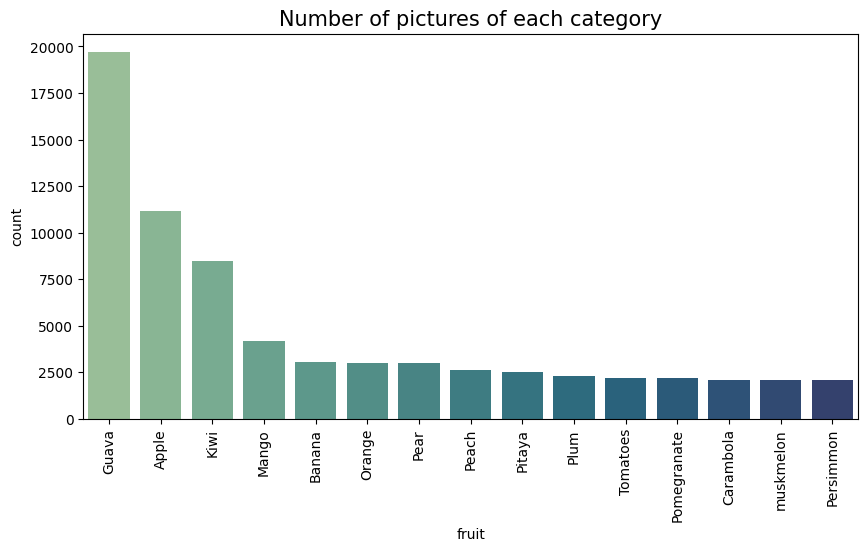

In [3]:
fc = df["fruit"].value_counts()
plt.figure(figsize=(10,5))
sns.barplot(x = fc.index, y = fc, palette = "crest")
plt.title("Number of pictures of each category", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

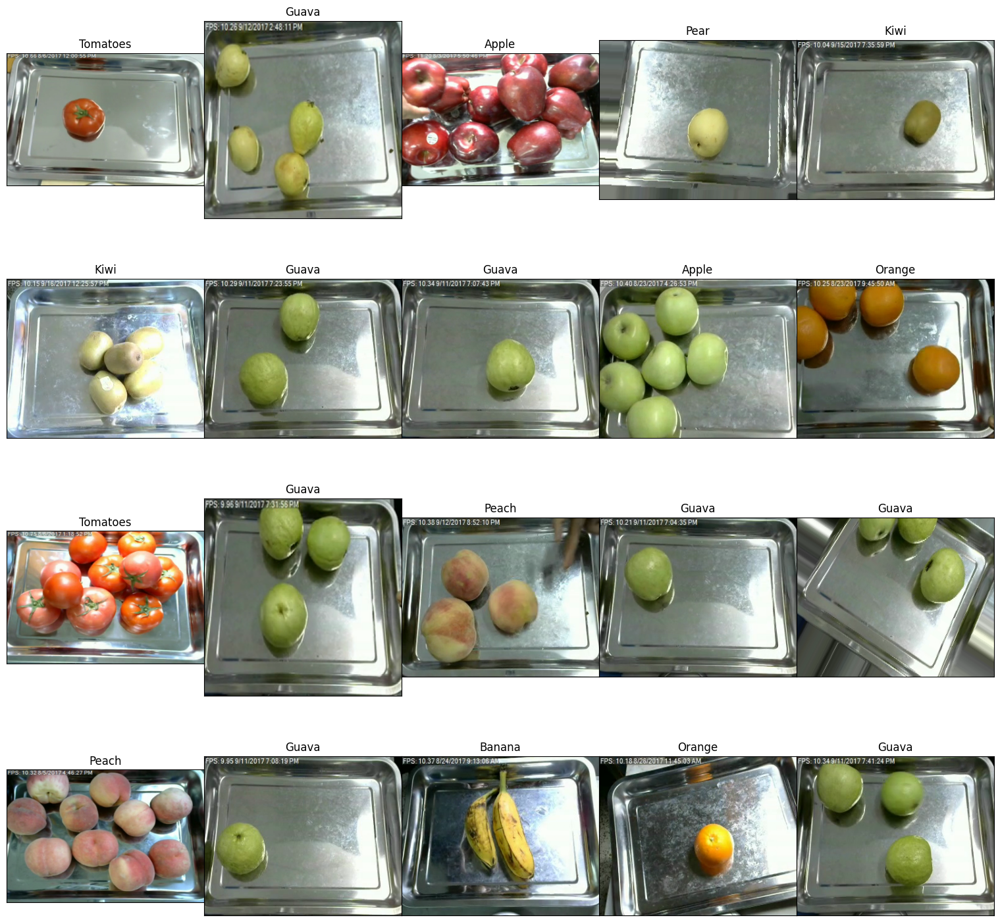

In [4]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df.path[i+20]))
    ax.set_title(df.fruit[i+20], fontsize = 12)
plt.tight_layout(pad=0.0)
plt.show()

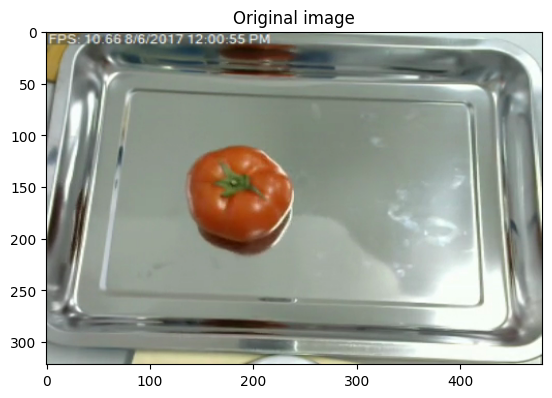

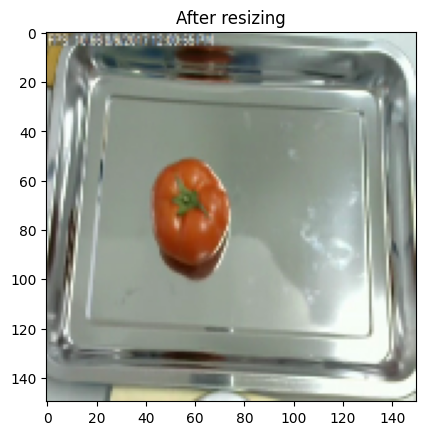

In [5]:
img = plt.imread(df.path[20])
plt.imshow(img)
plt.title("Original image")
plt.show()

plt.imshow(cv2.resize(img, (150,150)))
plt.title("After resizing")
plt.show()

In [6]:
print(df.shape)

(70549, 3)


In [7]:
def cut_df(df, number_of_parts, part):

    if part < 1:
        print("Error, the part should be at least 1")
    elif part > number_of_parts:
        print("Error, the part cannot be higher than the number_of_parts")
        
    number_imgs_each_part = int(df.shape[0]/number_of_parts)
    idx1 = (part-1) * number_imgs_each_part
    idx2 = part * number_imgs_each_part
    return df.iloc[idx1:idx2]

def load_img(df):

    img_paths = df["path"].values
    img_labels = df["label"].values
    X = []
    y = []
    
    for i,path in enumerate(img_paths):
        img =  plt.imread(path)
        img = cv2.resize(img, (150,150))
        label = img_labels[i]
        X.append(img)
        y.append(label)
    return np.array(X),np.array(y)

In [8]:
def from_categorical(lst):
    
    lst = lst.tolist()
    lst2 = []
    for x in lst:
        lst2.append(x.index(max(x)))
    return lst2

def display_stats(y_test, pred):
    print(f"### Result of the predictions using {len(y_test)} test data ###\n")
    y_test_class = from_categorical(y_test)
    print("Classification Report:\n")
    print(classification_report(y_test_class, pred))
    print("\nConfusion Matrix:\n\n")
    print(confusion_matrix(y_test_class, pred))
    print("\n")
    printmd(f"# Accuracy: {round(accuracy_score(y_test_class, pred),5)}")
    
def plot_training(model):
    history = pd.DataFrame(model.history.history)
    history[["accuracy","val_accuracy"]].plot()
    plt.title("Training results")
    plt.xlabel("# epoch")
    plt.show()

In [9]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation

def create_model():
    shape_img = (150, 150, 3)
    
    model = Sequential()

    # Số lượng lớp Conv2D và MaxPooling2D
    num_layers = 6
    filters = [32, 64, 64, 64, 64, 64]  # Số lượng filters cho mỗi lớp
    kernel_size = (3, 3)
    pool_size = (2, 2)

    # Tạo các lớp Conv2D và MaxPooling2D trong vòng lặp
    for filter_size in filters:
        model.add(Conv2D(filters=filter_size, kernel_size=kernel_size, 
                         input_shape=shape_img if model.layers == [] else None, 
                         activation='relu', padding='same'))
        model.add(MaxPooling2D(pool_size=pool_size))

    # Tiến hành các bước xử lý sau các lớp Conv2D
    model.add(Flatten())

    # Fully connected layer
    model.add(Dense(256))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    # Lớp đầu ra với số nhãn
    model.add(Dense(len(mapper_fruit_names)))  # mapper_fruit_names phải được định nghĩa ở nơi khác
    model.add(Activation('softmax'))

    # Biên dịch mô hình
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model


In [10]:
model = create_model()
hists = []

divisor = 5

start_time = time.time()
X_train, y_train = load_img(cut_df(df,divisor,1))
y_train = to_categorical(y_train)

callbacks = [EarlyStopping(monitor='val_loss', patience=20),
             ModelCheckpoint(filepath='best_model.keras', monitor='val_loss', save_best_only=True)]

model.fit(X_train, y_train, batch_size=128, epochs=100, callbacks=callbacks, validation_split = 0.1, verbose = 1)
hists.append(model.history.history)

Epoch 1/100


I0000 00:00:1734434373.052369      74 service.cc:145] XLA service 0x7bfe00009000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734434373.052422      74 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  4/100 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.1121 - loss: 2.9431

I0000 00:00:1734434380.447090      74 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - accuracy: 0.2675 - loss: 2.4930 - val_accuracy: 0.3487 - val_loss: 1.9838
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.3703 - loss: 1.9376 - val_accuracy: 0.4096 - val_loss: 1.7311
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4924 - loss: 1.5226 - val_accuracy: 0.6669 - val_loss: 0.8613
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.6897 - loss: 0.8224 - val_accuracy: 0.7789 - val_loss: 0.5808
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.7940 - loss: 0.5552 - val_accuracy: 0.8604 - val_loss: 0.3943
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.8529 - loss: 0.4121 - val_accuracy: 0.7945 - val_loss: 0.7161
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.8097 - loss: 0.7105 - val_accuracy: 0.8689 - val_loss: 0.4127
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.8680 - loss: 0.3763 - val_accura

In [11]:
gc.collect()

11616

In [12]:
model.save('fruit_model.keras')

In [13]:
time_model = time.time() - start_time
print(f"Time to train the model: {int(time_model)} seconds")

Time to train the model: 388 seconds


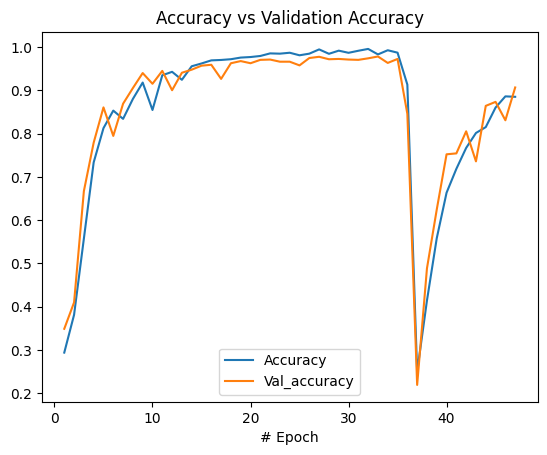

In [14]:
acc = []
val_acc = []
for i in range(len(hists)):
    acc += hists[i]["accuracy"]
    val_acc += hists[i]["val_accuracy"]
hist_df = pd.DataFrame({"# Epoch": [e for e in range(1,len(acc)+1)],"Accuracy": acc, "Val_accuracy": val_acc})
hist_df.plot(x = "# Epoch", y = ["Accuracy","Val_accuracy"])
plt.title("Accuracy vs Validation Accuracy")
plt.show()

In [15]:
import json
with open('history.json', 'w') as f:
    json.dump(hists, f)

In [16]:
temp_1 = cut_df(df,20,20)
temp_1.shape

(3527, 3)

In [17]:
import warnings
warnings.filterwarnings("ignore")

X, y = load_img(cut_df(df, 20, 20))
pred = (model.predict(X) > 0.5).astype("int32")
pred = np.argmax(model.predict(X), axis=1)
y_test = to_categorical(y)

print(f"Result of the predictions using {len(y_test)} test data ###\n")
y_test_class = from_categorical(y_test)
print("Classification Report:\n")
print(classification_report(y_test_class, pred))

111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Result of the predictions using 3527 test data ###

Classification Report:

              precision    recall  f1-score   support

           0       0.84      0.87      0.86       545
           1       0.79      0.69      0.74       129
           2       1.00      0.97      0.99       109
           3       0.97      0.98      0.98      1027
           4       0.91      0.98      0.95       395
           5       0.90      0.91      0.91       210
           6       0.97      0.97      0.97       151
           7       0.92      0.77      0.84       127
           8       0.81      0.88      0.84       131
           9       0.96      0.98      0.97       104
          10       0.84      0.85      0.85       131
          11       1.00      0.98      0.99       107
          12       0.90      0.90      0.90       129
          13       0.93      0.85      0.89       129
          14       0.76      0

<Axes: >

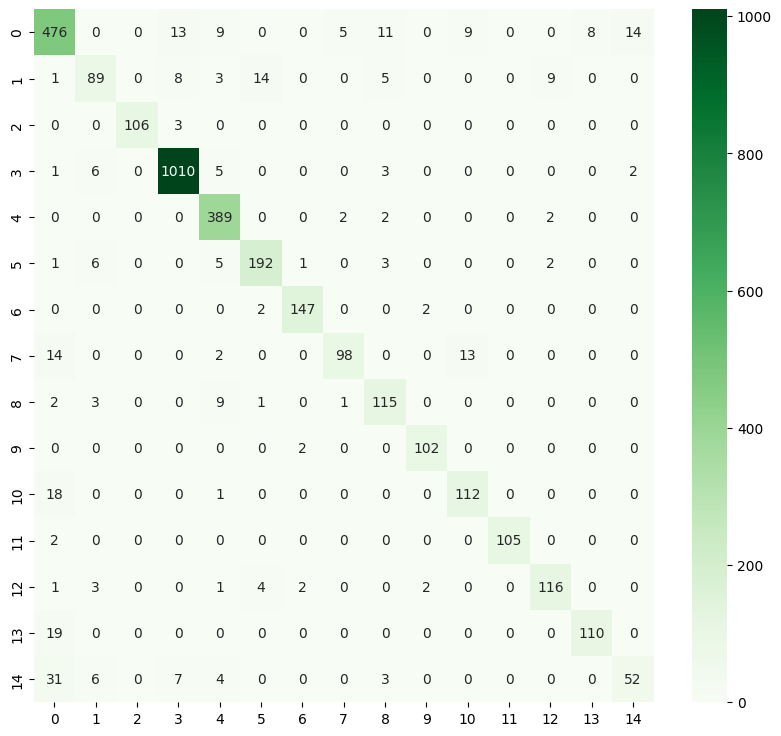

In [18]:
import seaborn as sns
f,ax=plt.subplots(figsize=(10,9))
conf_mat = confusion_matrix(y_test_class, pred)
sns.heatmap(conf_mat,annot=True,fmt='.0f', cmap="Greens")

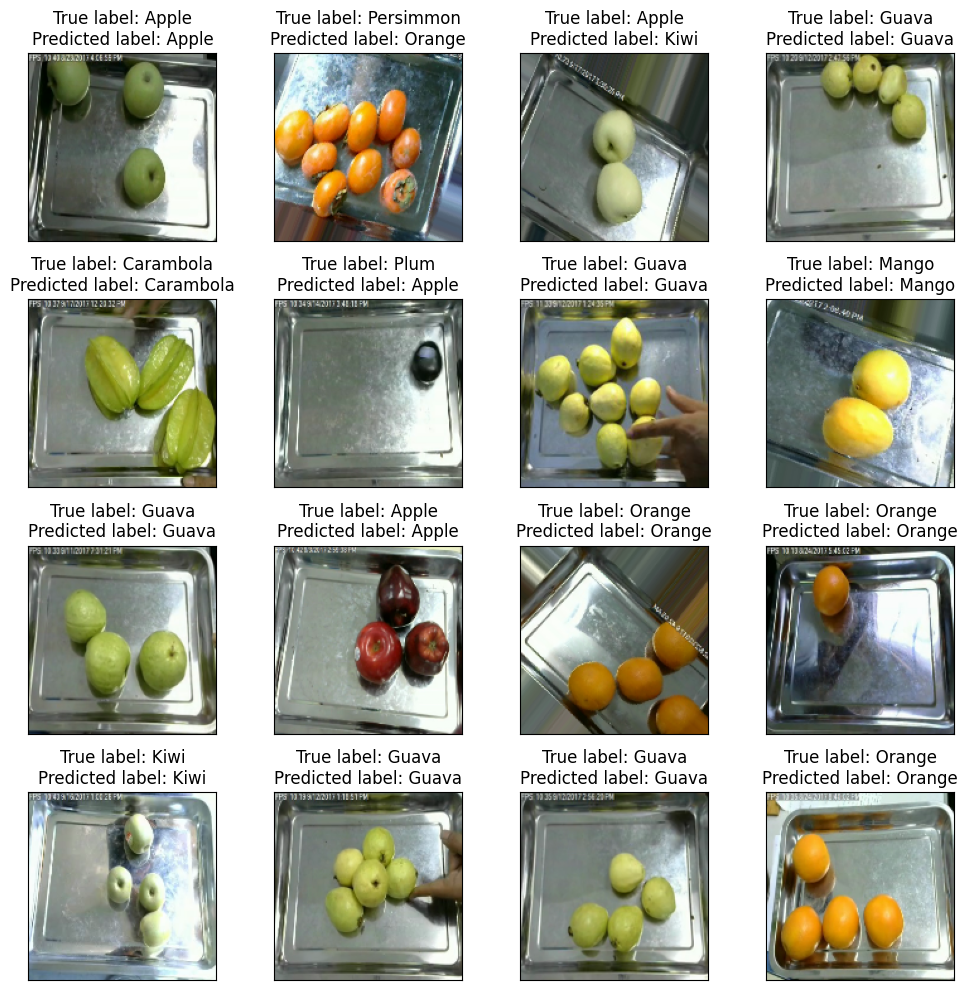

In [19]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(X[-i])
    ax.set_title(f"True label: {fruit_names[y[-i]]}\nPredicted label: {fruit_names[pred[-i]]}")

plt.tight_layout()
plt.show()

In [20]:
train_df,test_df = train_test_split(df[['path','fruit']].sample(frac=0.05,random_state=0), test_size=0.2,random_state=0)

In [21]:
import tensorflow as tf
from time import perf_counter
import warnings
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Tắt tất cả các cảnh báo TensorFlow
warnings.filterwarnings("ignore")  # Tắt cảnh báo Python
tf.get_logger().setLevel('ERROR')  # Chỉ hiển thị lỗi TensorFlow



def create_gen():
   
    # Load the Images with a generator and Data Augmentation
    train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.1
    )

    test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
    )

    train_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='path',
        y_col='fruit',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='training',
#         rotation_range=30, # Uncomment those lines to use data augmentation
#         zoom_range=0.15,
#         width_shift_range=0.2,
#         height_shift_range=0.2,
#         shear_range=0.15,
#         horizontal_flip=True,
#         fill_mode="nearest"
    )

    val_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='path',
        y_col='fruit',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='validation',
#         rotation_range=30, # Uncomment those lines to use data augmentation
#         zoom_range=0.15,
#         width_shift_range=0.2,
#         height_shift_range=0.2,
#         shear_range=0.15,
#         horizontal_flip=True,
#         fill_mode="nearest"
    )

    test_images = test_generator.flow_from_dataframe(
        dataframe=test_df,
        x_col='path',
        y_col='fruit',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=False
    )
    
    return train_generator,test_generator,train_images,val_images,test_images

def get_model(model):
# Load the pretained model
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights': 'imagenet',
                'pooling':'avg'}
    
    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False
    
    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(15, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# Dictionary with the models
models = {
    "DenseNet201": {"model": tf.keras.applications.DenseNet121, "perf": 0},
    "DenseNet169": {"model": tf.keras.applications.DenseNet169, "perf": 0},
    "DenseNet201": {"model": tf.keras.applications.DenseNet201, "perf": 0},
    "EfficientNetB0": {"model": tf.keras.applications.EfficientNetB0, "perf": 0},
    "EfficientNetB1": {"model": tf.keras.applications.EfficientNetB1, "perf": 0},
    "ResNet50": {"model": tf.keras.applications.ResNet50, "perf": 0},
    "ResNet101": {"model": tf.keras.applications.ResNet101, "perf": 0},
    "InceptionV3": {"model": tf.keras.applications.InceptionV3, "perf": 0},
    "MobileNetV2": {"model": tf.keras.applications.MobileNetV2, "perf": 0},
    "Xception": {"model": tf.keras.applications.Xception, "perf": 0}
}

# Create the generators
train_generator,test_generator,train_images,val_images,test_images=create_gen()
print('\n')

# Fit the models
for name, model in models.items():
    
    # Get the model
    m = get_model(model['model'])
    models[name]['model'] = m
    
    start = perf_counter()
    
    # Fit the model
    history = m.fit(train_images,validation_data=val_images,epochs=1,verbose=0)
    
    # Sav the duration and the val_accuracy
    duration = perf_counter() - start
    duration = round(duration,2)
    models[name]['perf'] = duration
    print(f"{name:20} trained in {duration} sec")
    
    val_acc = history.history['val_accuracy']
    models[name]['val_acc'] = [round(v,4) for v in val_acc]

Found 2539 validated image filenames belonging to 15 classes.
Found 282 validated image filenames belonging to 15 classes.
Found 706 validated image filenames belonging to 15 classes.


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


I0000 00:00:1734434720.837714      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434743.396269      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434769.200716      73 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434786.524346      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads



DenseNet201          trained in 105.46 sec
51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


I0000 00:00:1734434816.581978      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434826.560923      71 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434848.725325      73 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1734434856.920423      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads



DenseNet169          trained in 67.53 sec
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0       trained in 64.3 sec
27018416/27018416 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB1       trained in 91.56 sec
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
ResNet50             trained in 31.93 sec
171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
ResNet101            trained in 41.18 sec
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
InceptionV3          trained in 42.45 sec
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MobileNetV2          trained in 26.79 sec
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Xception             trained in 31.98 sec


In [22]:
for name, model in models.items():
    
    # Predict the label of the test_images
    pred = models[name]['model'].predict(test_images)
    pred = np.argmax(pred,axis=1)

    # Map the label
    labels = (train_images.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]

    y_test = list(test_df.fruit)
    acc = accuracy_score(y_test,pred)
    models[name]['acc'] = round(acc,4)
#     printmd(f'**{name} has a {acc * 100:.2f}% accuracy on the test set**')

 1/23 ━━━━━━━━━━━━━━━━━━━━ 5:03 14s/step

I0000 00:00:1734435214.349596      74 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 8 bytes spill stores, 8 bytes spill loads



23/23 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step
 1/23 ━━━━━━━━━━━━━━━━━━━━ 4:06 11s/step

I0000 00:00:1734435250.137117      72 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 8 bytes spill stores, 8 bytes spill loads



23/23 ━━━━━━━━━━━━━━━━━━━━ 25s 645ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 378ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 407ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 299ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 379ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 412ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step


In [23]:
# Create a DataFrame with the results
models_result = []

for name, v in models.items():
    models_result.append([ name, models[name]['val_acc'][-1], 
                          models[name]['acc'],
                          models[name]['perf']])
    
df_results = pd.DataFrame(models_result, 
                          columns = ['model','val_accuracy','accuracy','Training time (sec)'])
df_results.sort_values(by='accuracy', ascending=False, inplace=True)
df_results.reset_index(inplace=True,drop=True)
df_results

,model,val_accuracy,accuracy,Training time (sec)
0,DenseNet201,0.9433,0.9518,105.46
1,DenseNet169,0.9326,0.9363,67.53
2,MobileNetV2,0.8830,0.9065,26.79
3,Xception,0.8972,0.9037,31.98
4,InceptionV3,0.7908,0.7861,42.45
5,ResNet101,0.4007,0.4108,41.18
6,ResNet50,0.3865,0.3952,31.93
7,EfficientNetB1,0.2943,0.2847,91.56
8,EfficientNetB0,0.2943,0.2847,64.30


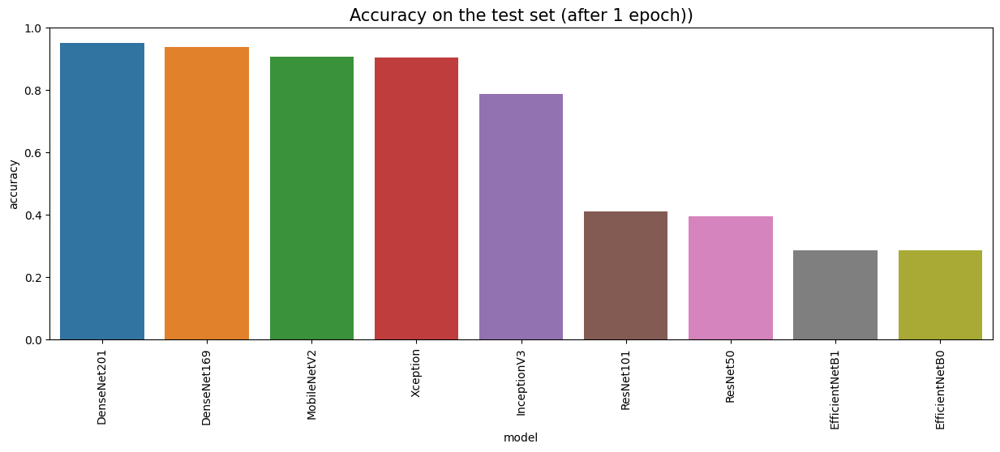

In [24]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'model', y = 'accuracy', data = df_results)
plt.title('Accuracy on the test set (after 1 epoch))', fontsize = 15)
plt.ylim(0,1)
plt.xticks(rotation=90)
plt.show()

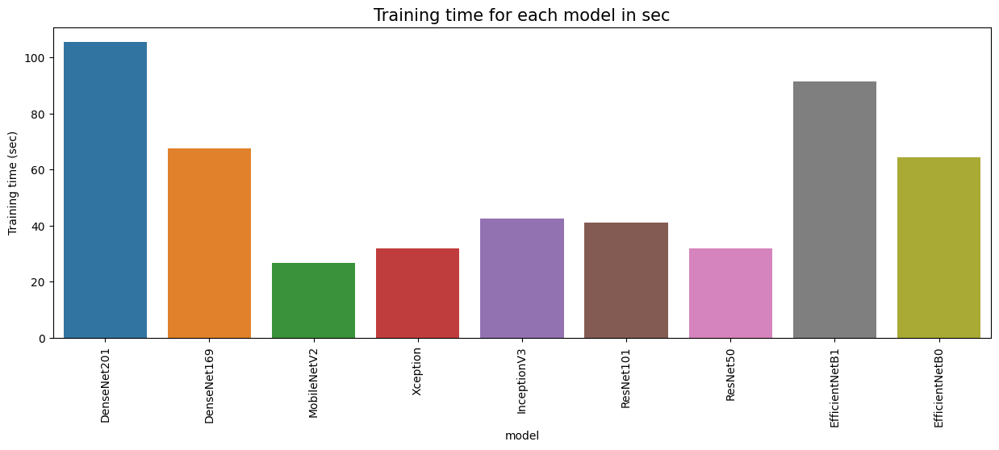

In [25]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'model', y = 'Training time (sec)', data = df_results)
plt.title('Training time for each model in sec', fontsize = 15)
# plt.ylim(0,20)
plt.xticks(rotation=90)
plt.show()

In [26]:
# Split into train/test datasets using all of the pictures
train_df,test_df = train_test_split(df, test_size=0.1, random_state=0)

# Create the generator
train_generator,test_generator,train_images,val_images,test_images=create_gen()

Found 57145 validated image filenames belonging to 15 classes.
Found 6349 validated image filenames belonging to 15 classes.
Found 7055 validated image filenames belonging to 15 classes.


In [27]:
gc.collect()

8406

In [28]:
model = get_model(tf.keras.applications.DenseNet169)
history = model.fit(train_images,
                    validation_data=val_images,
                    epochs=5,
                    callbacks=[
                        tf.keras.callbacks.EarlyStopping(
                            monitor='val_loss',
                            patience=1,
                            restore_best_weights=True)]
                    )

Epoch 1/5
1461/1786 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - accuracy: 0.9208 - loss: 0.2756

I0000 00:00:1734435896.583012      73 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads



1786/1786 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.9303 - loss: 0.2420

I0000 00:00:1734436063.266294      74 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 8 bytes spill stores, 8 bytes spill loads



1786/1786 ━━━━━━━━━━━━━━━━━━━━ 551s 295ms/step - accuracy: 0.9303 - loss: 0.2419 - val_accuracy: 0.9964 - val_loss: 0.0117
Epoch 2/5
1786/1786 ━━━━━━━━━━━━━━━━━━━━ 445s 249ms/step - accuracy: 0.9930 - loss: 0.0198 - val_accuracy: 0.9943 - val_loss: 0.0163


In [29]:
gc.collect()

3924

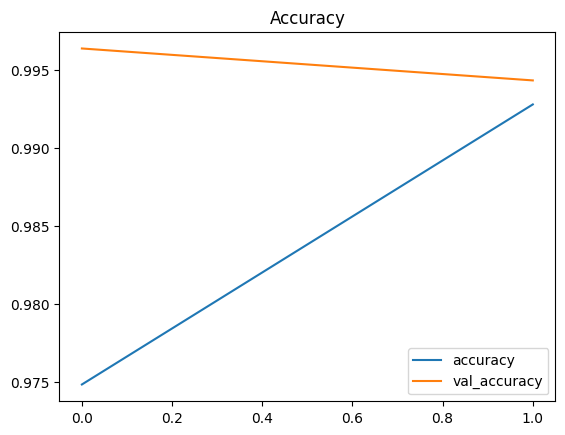

In [30]:
history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

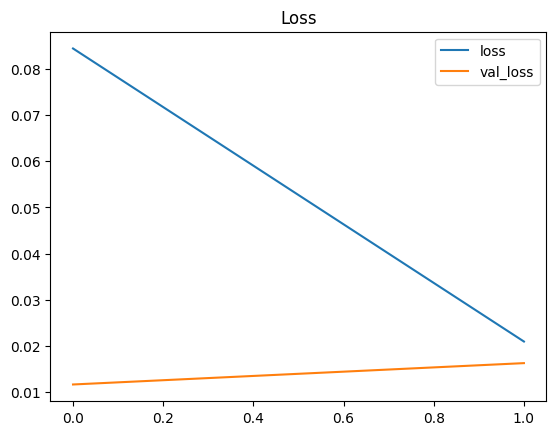

In [31]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()
plt.title("Loss")
plt.show()

In [32]:
pred = model.predict(test_images)
pred = np.argmax(pred, axis=1)
labels = (train_images.class_indices)
labels = dict((v, k) for k, v in labels.items())
pred = [labels[k] for k in pred]
y_test = list(test_df.fruit)
acc = accuracy_score(y_test, pred)
printmd(f'# Accuracy on the test set: {acc * 100:.2f}%')

221/221 ━━━━━━━━━━━━━━━━━━━━ 92s 375ms/step


I0000 00:00:1734436607.236554      74 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 8 bytes spill stores, 8 bytes spill loads



# Accuracy on the test set: 99.62%

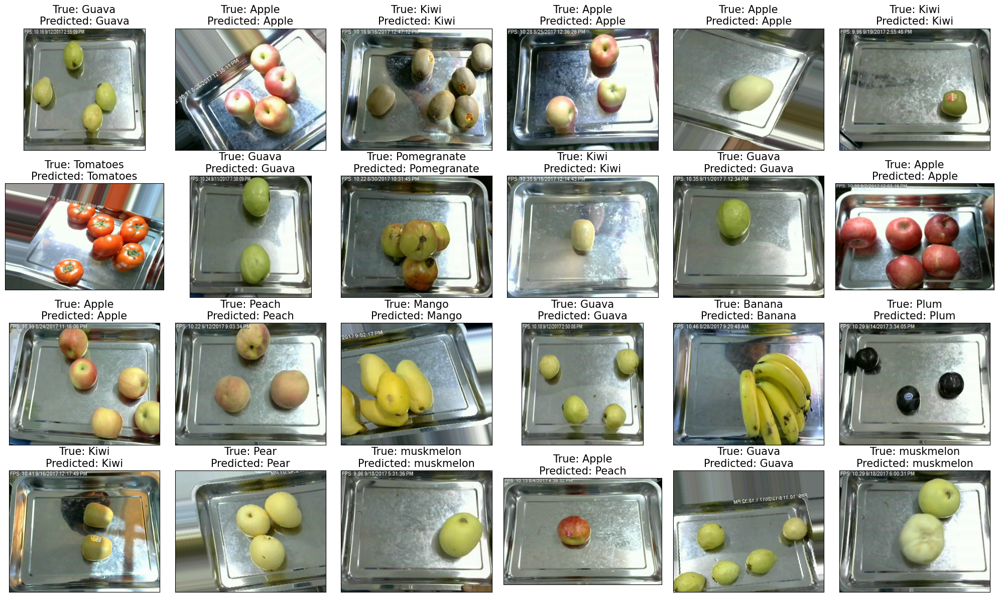

In [33]:
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.path.iloc[i]))
    ax.set_title(f"True: {test_df.fruit.iloc[i].split('_')[0]}\nPredicted: {pred[i].split('_')[0]}", fontsize=15)
plt.tight_layout()
plt.show()

In [34]:
from keras.models import load_model, Model
from keras.preprocessing import image
from keras.layers import Input
from sklearn.cluster import KMeans
import numpy as np
import os
import shutil
import cv2  # Thêm thư viện OpenCV để xử lý màu sắc

# Nhãn của các loại hoa quả
fruit_labels = {
    'Apple': 0, 'Banana': 1, 'Carambola': 2, 'Guava': 3, 'Kiwi': 4,
    'Mango': 5, 'Orange': 6, 'Peach': 7, 'Pear': 8, 'Persimmon': 9,
    'Pitaya': 10, 'Plum': 11, 'Pomegranate': 12, 'Tomatoes': 13, 'muskmelon': 14
}

# Load mô hình đã lưu
model_path = '/kaggle/working/best_model.keras'
model = load_model(model_path)

# Tạo input giả để "gọi" mô hình trước khi trích xuất đặc trưng
dummy_input = Input(shape=(150, 150, 3))
model(dummy_input)

# Tạo mô hình trích xuất đặc trưng
feature_extraction_model = Model(inputs=model.input, outputs=model.layers[-2].output)

# Thư mục đầu vào và các thư mục lưu trữ
input_images_directory = '/kaggle/input/fruit-recognition/Apple/Total Number of Apples'  # Đường dẫn thư mục đầu vào
folder_predicted = '/kaggle/working/data_predicted'  # Thư mục kết quả

# Hàm để chuẩn bị thư mục (tạo mới hoặc làm sạch nếu đã tồn tại)
def prepare_folder(path):
    if not os.path.exists(path):
        os.makedirs(path)

# Tạo các thư mục gốc nếu chưa có
prepare_folder(folder_predicted)

# Hàm đọc và tiền xử lý ảnh
def load_and_preprocess_image(image_path):
    try:
        img = image.load_img(image_path, target_size=(150, 150))  # Resize về kích thước 150x150
        img_array = image.img_to_array(img) / 255.0              # Chuẩn hóa ảnh về [0, 1]
        return np.expand_dims(img_array, axis=0)                 # Thêm batch dimension (1, 150, 150, 3)
    except Exception as e:
        print(f"Lỗi khi đọc ảnh {image_path}: {e}")
        return None

def get_average_hsv(image_array):
    try:
        # Chuyển ảnh sang không gian màu HSV
        hsv_image = cv2.cvtColor(image_array[0], cv2.COLOR_RGB2HSV)
        # Tính toán trung bình của tất cả các kênh màu
        average_hsv = np.mean(hsv_image, axis=(0, 1))  # Trả về giá trị trung bình của H, S, V
        return average_hsv
    except Exception as e:
        print(f"Lỗi khi tính toán trung bình HSV: {e}")
        return None

# Dự đoán nhãn và di chuyển ảnh vào thư mục tương ứng
for image_file in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_file)

    # Dự đoán nhãn
    img_array = load_and_preprocess_image(image_path)
    if img_array is not None:
        try:
            # Loại bỏ tham số training=False khỏi hàm predict
            predictions = model(img_array, training=False)  # Thêm tham số training=False
            predicted_label = np.argmax(predictions, axis=1)[0]

            # Tìm tên nhãn từ dictionary
            predicted_fruit = next(key for key, value in fruit_labels.items() if value == predicted_label)

            # Tạo thư mục nhãn nếu chưa tồn tại
            output_class_directory = os.path.join(folder_predicted, predicted_fruit)
            prepare_folder(output_class_directory)  # Đảm bảo thư mục tồn tại

            # Di chuyển ảnh vào thư mục tương ứng
            shutil.copy(image_path, output_class_directory)
        except Exception as e:
            print(f"Lỗi khi dự đoán với ảnh {image_path}: {e}")

print("Phân loại hoàn thành. Ảnh đã được di chuyển vào thư mục tương ứng.")

# Số lượng cụm cho KMeans
num_clusters = 5

# Duyệt qua các thư mục ảnh đã được phân loại
for fruit_folder in os.listdir(folder_predicted):
    fruit_folder_path = os.path.join(folder_predicted, fruit_folder)

    # Lấy danh sách ảnh trong thư mục
    image_files = [os.path.join(fruit_folder_path, f) for f in os.listdir(fruit_folder_path)
                   if f.endswith(('.png', '.jpg', '.jpeg'))]

    # Kiểm tra số lượng ảnh trong thư mục
    print(f"Số lượng ảnh trong thư mục {fruit_folder}: {len(image_files)}")
    
    # Nếu số lượng ảnh ít, bỏ qua thư mục đó
    if len(image_files) < num_clusters:
        print(f"Thư mục {fruit_folder} có quá ít ảnh để phân cụm. Bỏ qua.")
        continue

    # Trích xuất đặc trưng cho từng ảnh
    features_list = []
    for img_path in image_files:
        try:
            img_array = load_and_preprocess_image(img_path)
            if img_array is not None:
                print(f"Đang xử lý ảnh: {img_path} với kích thước: {img_array.shape}")
                feature = get_average_hsv(img_array)
                features_list.append(feature)

        except Exception as e:
            print(f"Lỗi khi xử lý ảnh {img_path}: {e}")

    # Kiểm tra xem có đặc trưng nào không
    if not features_list:
        print(f"Không có đặc trưng để phân cụm cho thư mục {fruit_folder}. Bỏ qua.")
        continue

    # Chạy KMeans để phân cụm các đặc trưng
    try:
        print(f"Đang phân cụm cho thư mục {fruit_folder}...")
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(features_list)

        # Tạo thư mục cho từng cụm trong thư mục hoa quả
        for cluster_id in range(num_clusters):
            cluster_folder = os.path.join(fruit_folder_path, f'Cluster_{cluster_id}')
            prepare_folder(cluster_folder)

        # Di chuyển ảnh vào các thư mục cụm tương ứng trong thư mục hoa quả
        for idx, img_path in enumerate(image_files):
            cluster_id = kmeans.labels_[idx]
            print(f"Đang di chuyển ảnh {img_path} vào Cluster_{cluster_id}")
            shutil.move(img_path, os.path.join(fruit_folder_path, f'Cluster_{cluster_id}'))

        print(f"Phân cụm hoàn thành cho thư mục {fruit_folder}.")
    except Exception as e:
        print(f"Lỗi khi thực thi KMeans cho thư mục {fruit_folder}: {e}")

print("Phân cụm hoàn thành. Ảnh đã được di chuyển vào các thư mục cụm tương ứng.")


Phân loại hoàn thành. Ảnh đã được di chuyển vào thư mục tương ứng.
Số lượng ảnh trong thư mục Tomatoes: 23
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 04567.jpeg với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 01741.png với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 01384.png với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 01042.png với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 04311.jpeg với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 01192.png với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 01282.png với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tomatoes/Apple 04230.jpeg với kích thước: (1, 150, 150, 3)
Đang xử lý ảnh: /kaggle/working/data_predicted/Tom

In [35]:
import shutil
import os

# Đường dẫn tới các thư mục bạn muốn xóa
folder2_path = '/kaggle/working/data_predicted'

# Kiểm tra và xóa folder 2
if os.path.exists(folder2_path):
    shutil.rmtree(folder2_path)
    print(f"Thư mục {folder2_path} đã bị xóa.")
else:
    print(f"Thư mục {folder2_path} không tồn tại.")

Thư mục /kaggle/working/data_predicted đã bị xóa.
